## Initial setup

In [1]:
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:95% !important; }</style>"))
%matplotlib inline
%load_ext autoreload
%autoreload 2
import sys,os, pprint, pickle
pp = pprint.PrettyPrinter(indent=2, width=100)
print('Current working dir: ', os.getcwd())
if '..' not in sys.path:
    print("appending '..' to sys.path")
    sys.path.append('..')
import copy    
import numpy as np
import matplotlib.pyplot as plt
from matplotlib          import cm
import mrcnn.utils       as utils
import mrcnn.visualize   as visualize
import mrcnn.visualize  as vis
import mrcnn.visualize_2 as vis2
from mrcnn.prep_notebook import build_fcn_training_pipeline, run_mrcnn_training_pipeline
from mrcnn.prep_notebook import build_fcn_inference_pipeline_newshapes, build_mrcnn_inference_pipeline
from mrcnn.prep_notebook import run_mrcnn_detection
from mrcnn.visualize     import display_training_batch
from mrcnn.prep_notebook import get_inference_batch, get_image_batch, run_mrcnn_detection, run_fcn_detection
from mrcnn.coco          import prep_coco_dataset
from mrcnn.newshapes     import prep_newshape_dataset
# from mrcnn.utils         import trim_zeros, compute_overlaps
# from mrcnn.calculate_map import update_map_dictionaries

# WEIGHT_FILE = 'F:/models/train_fcn8_coco_adam/fcn20181109T0000/fcn_2298.h5' 
# FCN_WEIGHT_FILE = 'F:\\models_newshapes\\train_fcn8_l2_newshapes\\fcn20181224T0000\\fcn_0821.h5'
##------------------------------------------------------------------------------------
## Parse command line arguments
##------------------------------------------------------------------------------------
parser = utils.command_line_parser()
input_parms  =" --batch_size     1  "
input_parms +=" --dataset        newshapes2 "
input_parms +=" --mrcnn_logs_dir train_mrcnn "
input_parms +=" --fcn_logs_dir   train_fcn8L2_BCE1 " 
input_parms +=" --mrcnn_model    /home/kbardool/models_newshapes2/train_mrcnn/mrcnn20190318T0000/"+ "mrcnn_0020.h5 "
input_parms +=" --fcn_model      /home/kbardool/models_newshapes2/train_fcn8L2_BCE1/fcn20190323T0000/" + "fcn_0089.h5"
# input_parms +=" --fcn_layer      all"
input_parms +=" --fcn_arch       fcn8l2 " 
input_parms +=" --sysout         screen "
input_parms +=" --scale_factor   1"
args = parser.parse_args(input_parms.split())
utils.display_input_parms(args)

Current working dir:  /home/kbardool/git_projs/mrcnn3/notebooks
appending '..' to sys.path


Using TensorFlow backend.


 Init Image Class - Possible Object Choices:  {'sun': 1, 'car': 3, 'building': 3, 'airplane': 3, 'person': 5, 'tree': 5, 'cloud': 3, 'truck': 3}
 Init Image Class - Custom Color Keys      :  ['sun', 'ground', 'person', 'tree', 'cloud', 'sky']
 Init Image Class - Object Priority List   :  ['building', 'tree', 'car']
 Init Image Class - BUILD_MAX_TRIES        :  7
 Init Image Class - PERSON_CAR_DISTANCE    :  10

   Arguments passed :
   --------------------
   batch_size                     1
   coco_classes                   None
   dataset                        newshapes2
   epochs                         1
   evaluate_method                1
   fcn_arch                       FCN8L2
   fcn_bce_loss_class             0
   fcn_bce_loss_method            1
   fcn_layers                     ['fcn32+']
   fcn_logs_dir                   train_fcn8L2_BCE1
   fcn_losses                     fcn_BCE_loss
   fcn_model                      /home/kbardool/models_newshapes2/train_fcn8L2_BCE1/fcn20

## Load test dataset

In [2]:
# del dataset_train, dataset_val, train_generator, val_generator
# dataset_test , test_generator   = prep_newshape_dataset( mrcnn_model.config,  1000, generator=True)
# with open('newshapes_dataset_1000_B.pkl', 'wb') as outfile:
#     pickle.dump(dataset_test, outfile)
## -- OR --

with open(os.path.join( "/home/kbardool/MLDatasets/newshapes2","newshapes2_test_dataset_1000_A.pkl"), 'rb') as infile:
    dataset_test = pickle.load(infile)
print(type(dataset_test))    

dataset_test.display_active_class_info()
print("Testing Dataset Image Count: {}".format(len(dataset_test.image_ids)))
print("Testing Dataset Class Count: {}".format(dataset_test.num_classes))
print(len(dataset_test.image_ids))    
class_names = dataset_test.class_names

<class 'mrcnn.newshapes2.NewImagesDataset'>
 Active Class Information 
--------------------------
[1, 2, 3, 4, 5, 6, 7, 8]
internal_class:  1 ext_cls: 1 category-name: None - person
internal_class:  2 ext_cls: 2 category-name: None - car
internal_class:  3 ext_cls: 3 category-name: None - sun
internal_class:  4 ext_cls: 4 category-name: None - building
internal_class:  5 ext_cls: 5 category-name: None - tree
internal_class:  6 ext_cls: 6 category-name: None - cloud
internal_class:  7 ext_cls: 7 category-name: None - airplane
internal_class:  8 ext_cls: 8 category-name: None - truck
Testing Dataset Image Count: 1000
Testing Dataset Class Count: 9
1000


###  Display some images from dataset

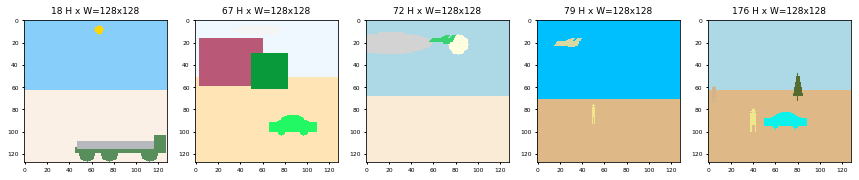

In [3]:
# image_list = list(range(160,200))
# image_list = list(range(0, 80))
image_list = [18, 67, 72, 79, 176]
image_titles = [str(i) for i in image_list]
images = get_image_batch(dataset_test, image_list)
visualize.display_images(images, titles = image_titles, cols = 8, width = 24)

##  Manipulate some images to test contextual relationships

#### Manipulate image 18

In [28]:
image_id = 18
save_shapes = copy.copy(dataset_test.image_info[image_id]['shapes'])
pp.pprint(save_shapes)

[('sun', (255.0, 215.0, 0.0), (67, 9, 4, 4)), ('truck', (87.0, 142.0, 92.0), (86, 117, 40, 13))]


[]
[('sun', (0.0, 0.0, 0.0), (7, 9, 4, 4))]
 Image_id    :  18  Reference:  [('sun', (0.0, 0.0, 0.0), (7, 9, 4, 4))] Coco Id: 18
 Image meta  :  [ 18 128 128   3   0   0 128 128   1   1]
 Class ids   :  (1,)    [3]
 Class Names :  ['sun']


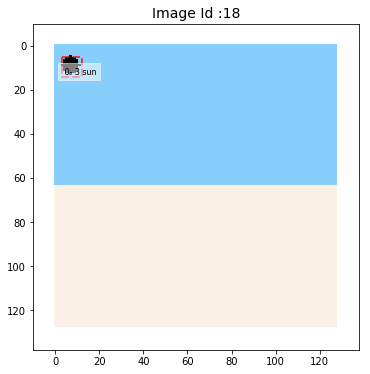

In [31]:
# pp.pprint(save_shapes)
# dataset_test.image_info[image_id]['shapes'] = save_shapes
pp.pprint(dataset_test.image_info[image_id]['shapes'])


# del dataset_test.image_info[image_id]['shapes'][0:2]
# new_obj  = ('car', black, (64,64, 15, 7))
# person = ('person', (139.0, 69.0, 19.0), (17, 92, 2, 10))
## person = ('person', (240.0, 230.0, 140.0), (40, 92, 2, 10))

new_obj = ('sun', (0.0, 0.0, 0.0), (7, 9, 4, 4))
dataset_test.image_info[image_id]['shapes'].append(new_obj)

pp.pprint(dataset_test.image_info[image_id]['shapes'])

vis.display_image_gt(dataset_test, dataset_test.config, image_id, size=6, verbose = True)

In [30]:
del dataset_test.image_info[image_id]['shapes'][0]

vis.display_image_gt(dataset_test, dataset_test.config, image_id, size=6, verbose = True)

IndexError: index -1 is out of bounds for axis 2 with size 0

 Image_id    :  18  Reference:  [('sun', (0.0, 0.0, 0.0), (67, 9, 4, 4))] Coco Id: 18
 Image meta  :  [ 18 128 128   3   0   0 128 128   1   1]
 Class ids   :  (1,)    [3]
 Class Names :  ['sun']


IndexError: index -1 is out of bounds for axis 2 with size 0

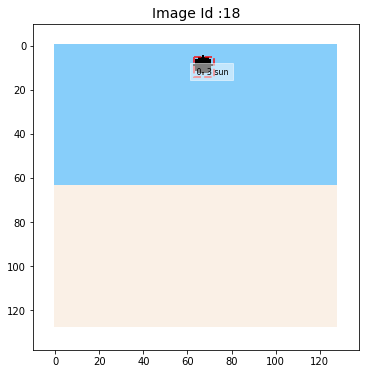

In [13]:
# new_obj  = ('car', black, (cx, cy, 15, 7))
new_obj = ('sun', (0.0, 0.0, 0.0), (67, 9, 4, 4))
dataset_test.image_info[image_id]['shapes'].append(new_obj)

vis.display_image_gt(dataset_test, dataset_test.config, image_id, size=6)

del dataset_test.image_info[image_id]['shapes'][-1]
vis.display_image_gt(dataset_test, dataset_test.config, image_id, size=6)

 Image_id    :  79  Reference:  [('airplane', (215.0, 217.0, 161.0), (31, 23, 16, 6)), ('person', (240.0, 230.0, 140.0), (50, 86, 1, 9))] Coco Id: 79
 Image meta  :  [    79    128    128      3      0      0    128    128      1      1]
 Class ids   :  (2,)    [     7      1]
 Class Names :  ['airplane', 'person']


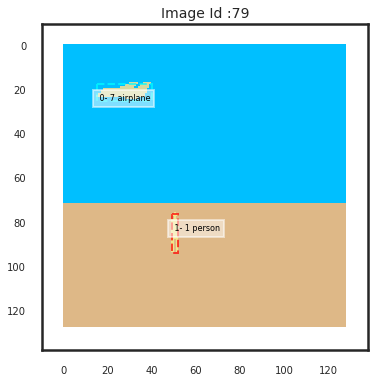

In [410]:
dataset_test.image_info[image_id]['shapes'] = save_shapes
vis.display_image_gt(dataset_test, dataset_test.config, image_id, size=6)

#### Manipulate image 67

In [83]:
image_id = 67
# save_shapes = copy.copy(dataset_test.image_info[image_id]['shapes'])
pp.pprint(save_shapes)

[ ('cloud', (245.0, 245.0, 245.0), (57, 9, 21, 4)),
  ('building', (185.0, 89.0, 119.0), (32, 38, 28, 21)),
  ('building', (9.0, 154.0, 59.0), (66, 46, 16, 16)),
  ('car', (34.0, 247.0, 100.0), (87, 96, 21, 10))]


[('airplane', (215.0, 217.0, 161.0), (31, 23, 16, 6))]
 Image_id    :  67  Reference:  [('airplane', (215.0, 217.0, 161.0), (31, 23, 16, 6))] Coco Id: 67
 Image meta  :  [    67    128    128      3      0      0    128    128      1      1]
 Class ids   :  (1,)    [     7]
 Class Names :  ['airplane']


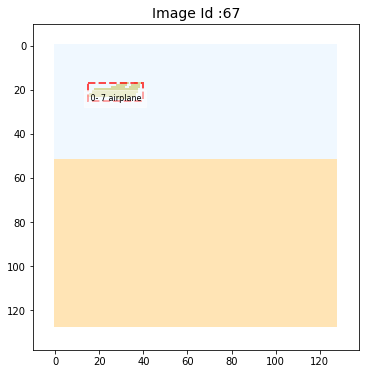

In [84]:
# pp.pprint(save_shapes)
# dataset_test.image_info[image_id]['shapes'] = save_shapes
# del dataset_test.image_info[image_id]['shapes'][0:2]
# new_obj  = ('car', black, (64,64, 15, 7))
# person = ('person', (139.0, 69.0, 19.0), (17, 92, 2, 10))
## person = ('person', (240.0, 230.0, 140.0), (40, 92, 2, 10))
dataset_test.image_info[image_id]['shapes'].append(('airplane', (215.0, 217.0, 161.0), (31, 23, 16, 6)))


pp.pprint(dataset_test.image_info[image_id]['shapes'])

vis.display_image_gt(dataset_test, dataset_test.config, image_id, size=6, verbose = True)

 Image_id    :  67  Reference:  [('building', (0.0, 0.0, 0.0), (4, 4, 16, 16))] Coco Id: 67
 Image meta  :  [    67    128    128      3      0      0    128    128      1      1]
 Class ids   :  (1,)    [     4]
 Class Names :  ['building']


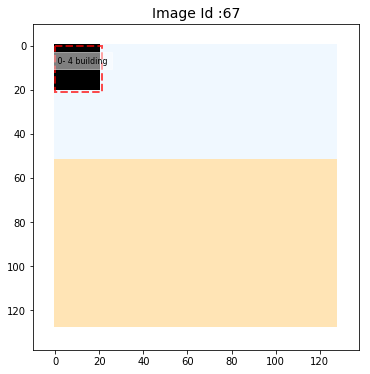

In [76]:
del dataset_test.image_info[image_id]['shapes'][:4]
# new_obj = ('sun', (0.0, 0.0, 0.0), (7, 9, 4, 4))
new_obj = ('building', (0.0, 0.0, 0.0), (4, 4, 16, 16))
dataset_test.image_info[image_id]['shapes'].append(new_obj)
vis.display_image_gt(dataset_test, dataset_test.config, image_id, size=6, verbose = True)

 Image_id    :  18  Reference:  [('sun', (0.0, 0.0, 0.0), (67, 9, 4, 4))] Coco Id: 18
 Image meta  :  [ 18 128 128   3   0   0 128 128   1   1]
 Class ids   :  (1,)    [3]
 Class Names :  ['sun']


IndexError: index -1 is out of bounds for axis 2 with size 0

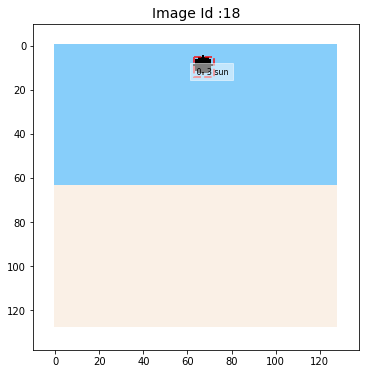

In [13]:
# new_obj  = ('car', black, (cx, cy, 15, 7))
new_obj = ('sun', (0.0, 0.0, 0.0), (67, 9, 4, 4))
dataset_test.image_info[image_id]['shapes'].append(new_obj)

vis.display_image_gt(dataset_test, dataset_test.config, image_id, size=6)

del dataset_test.image_info[image_id]['shapes'][-1]
vis.display_image_gt(dataset_test, dataset_test.config, image_id, size=6)

 Image_id    :  79  Reference:  [('airplane', (215.0, 217.0, 161.0), (31, 23, 16, 6)), ('person', (240.0, 230.0, 140.0), (50, 86, 1, 9))] Coco Id: 79
 Image meta  :  [    79    128    128      3      0      0    128    128      1      1]
 Class ids   :  (2,)    [     7      1]
 Class Names :  ['airplane', 'person']


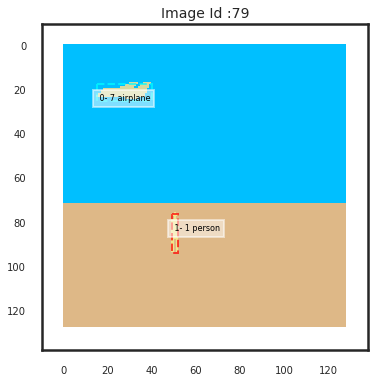

In [410]:
dataset_test.image_info[image_id]['shapes'] = save_shapes
vis.display_image_gt(dataset_test, dataset_test.config, image_id, size=6)

#### Manipulate image 79

In [406]:
image_id = 79
save_shapes = copy.copy(dataset_test.image_info[image_id]['shapes'])
pp.pprint(save_shapes)

[ ('airplane', (215.0, 217.0, 161.0), (31, 23, 16, 6)),
  ('person', (240.0, 230.0, 140.0), (50, 86, 1, 9))]


 Image_id    :  79  Reference:  [('airplane', (215.0, 217.0, 161.0), (31, 23, 16, 6)), ('person', (240.0, 230.0, 140.0), (50, 86, 1, 9))] Coco Id: 79
 Image meta  :  [    79    128    128      3      0      0    128    128      1      1]
 Class ids   :  (2,)    [     7      1]
 Class Names :  ['airplane', 'person']


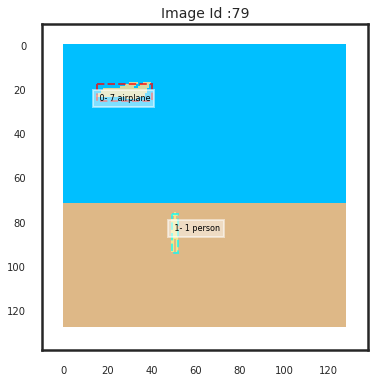

In [411]:
# new_obj  = ('car', black, (64,64, 15, 7))
# person = ('person', (139.0, 69.0, 19.0), (17, 92, 2, 10))
## person = ('person', (240.0, 230.0, 140.0), (40, 92, 2, 10))

vis.display_image_gt(dataset_test, dataset_test.config, image_id, size=6, verbose = True)

 Image_id    :  79  Reference:  [('person', (240.0, 230.0, 140.0), (50, 86, 1, 9))] Coco Id: 79
 Image meta  :  [    79    128    128      3      0      0    128    128      1      1]
 Class ids   :  (1,)    [     1]
 Class Names :  ['person']


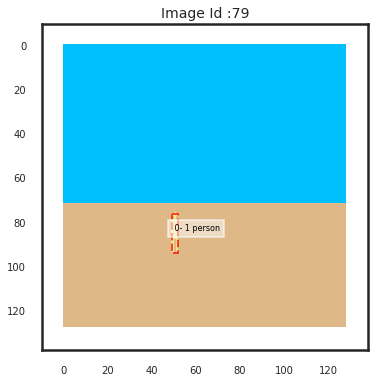

In [412]:
del dataset_test.image_info[image_id]['shapes'][0]
vis.display_image_gt(dataset_test, dataset_test.config, image_id, size=6, verbose = True)

 Image_id    :  79  Reference:  [('person', (240.0, 230.0, 140.0), (50, 86, 1, 9)), ('car', (0.0, 0.0, 0.0), (122, 122, 15, 7))] Coco Id: 79
 Image meta  :  [    79    128    128      3      0      0    128    128      1      1]
 Class ids   :  (2,)    [     1      2]
 Class Names :  ['person', 'car']
 Image_id    :  79  Reference:  [('person', (240.0, 230.0, 140.0), (50, 86, 1, 9))] Coco Id: 79
 Image meta  :  [    79    128    128      3      0      0    128    128      1      1]
 Class ids   :  (1,)    [     1]
 Class Names :  ['person']


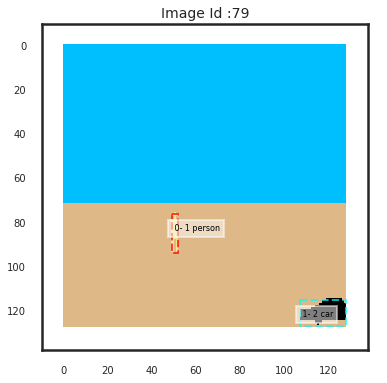

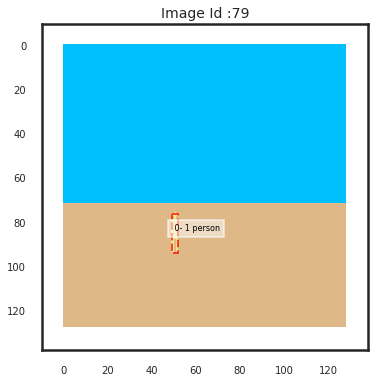

In [409]:
new_obj  = ('car', black, (cx, cy, 15, 7))
dataset_test.image_info[image_id]['shapes'].append(new_obj)
vis.display_image_gt(dataset_test, dataset_test.config, image_id, size=6)

del dataset_test.image_info[image_id]['shapes'][-1]
vis.display_image_gt(dataset_test, dataset_test.config, image_id, size=6)

 Image_id    :  79  Reference:  [('airplane', (215.0, 217.0, 161.0), (31, 23, 16, 6)), ('person', (240.0, 230.0, 140.0), (50, 86, 1, 9))] Coco Id: 79
 Image meta  :  [    79    128    128      3      0      0    128    128      1      1]
 Class ids   :  (2,)    [     7      1]
 Class Names :  ['airplane', 'person']


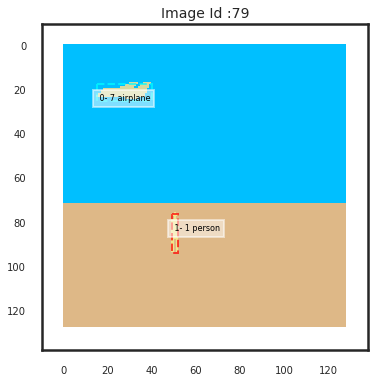

In [410]:
dataset_test.image_info[image_id]['shapes'] = save_shapes
vis.display_image_gt(dataset_test, dataset_test.config, image_id, size=6)

#### Manipulate image 176

[ ('tree', (85.0, 107.0, 47.0), (80, 60, 4, 12)),
  ('person', (210.0, 180.0, 140.0), (5, 68, 1, 7)),
  ('car', (11.0, 242.0, 235.0), (69, 92, 19, 9)),
  ('person', (240.0, 230.0, 140.0), (40, 92, 2, 10))]
 Image_id    :  176  Reference:  [('tree', (85.0, 107.0, 47.0), (80, 60, 4, 12)), ('person', (210.0, 180.0, 140.0), (5, 68, 1, 7)), ('car', (11.0, 242.0, 235.0), (69, 92, 19, 9)), ('person', (240.0, 230.0, 140.0), (40, 92, 2, 10))] Coco Id: 176
 Image meta  :  [   176    128    128      3      0      0    128    128      1      1]
 Class ids   :  (4,)    [     5      1      2      1]
 Class Names :  ['tree', 'person', 'car', 'person']


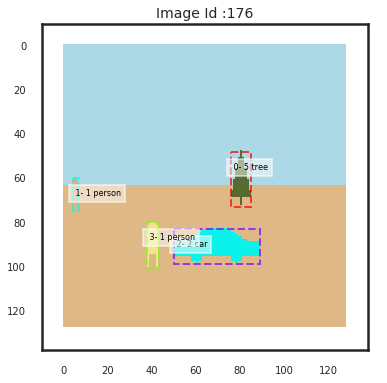

In [429]:
# new_obj  = ('car', black, (64,64, 15, 7))
# person = ('person', (139.0, 69.0, 19.0), (17, 92, 2, 10))
image_id = 176
save_shapes = copy.copy(dataset_test.image_info[image_id]['shapes'])
pp.pprint(save_shapes)
vis.display_image_gt(dataset_test, dataset_test.config, image_id, size=6, verbose = True)

 Image_id    :  176  Reference:  [('car', (11.0, 242.0, 235.0), (69, 92, 19, 9))] Coco Id: 176
 Image meta  :  [   176    128    128      3      0      0    128    128      1      1]
 Class ids   :  (1,)    [     2]
 Class Names :  ['car']


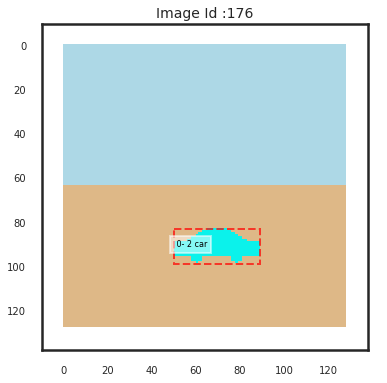

In [430]:
del dataset_test.image_info[image_id]['shapes'][0:2]
del dataset_test.image_info[image_id]['shapes'][-1]
vis.display_image_gt(dataset_test, dataset_test.config, image_id, size=6, verbose = True)

 Image_id    :  176  Reference:  [('car', (11.0, 242.0, 235.0), (69, 92, 19, 9)), ('person', (0.0, 0.0, 0.0), (64, 64, 2, 10))] Coco Id: 176
 Image meta  :  [   176    128    128      3      0      0    128    128      1      1]
 Class ids   :  (2,)    [     2      1]
 Class Names :  ['car', 'person']


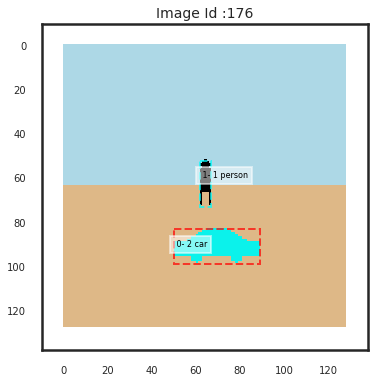

In [426]:
person = ('person', (0.0, 0.0, 0.0), (64, 64, 2, 10))
dataset_test.image_info[image_id]['shapes'].append(person)
vis.display_image_gt(dataset_test, dataset_test.config, image_id, size=6, verbose = True)

 Image_id    :  176  Reference:  [('car', (11.0, 242.0, 235.0), (69, 92, 19, 9))] Coco Id: 176
 Image meta  :  [   176    128    128      3      0      0    128    128      1      1]
 Class ids   :  (1,)    [     2]
 Class Names :  ['car']


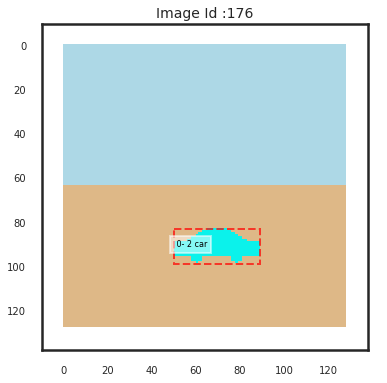

In [427]:
dataset_test.image_info[image_id]['shapes'].pop(-1)
vis.display_image_gt(dataset_test, dataset_test.config, image_id, size=6, verbose = True)


 Image_id    :  176  Reference:  [('tree', (85.0, 107.0, 47.0), (80, 60, 4, 12)), ('person', (210.0, 180.0, 140.0), (5, 68, 1, 7)), ('car', (11.0, 242.0, 235.0), (69, 92, 19, 9)), ('person', (240.0, 230.0, 140.0), (40, 92, 2, 10))] Coco Id: 176
 Image meta  :  [   176    128    128      3      0      0    128    128      1      1]
 Class ids   :  (4,)    [     5      1      2      1]
 Class Names :  ['tree', 'person', 'car', 'person']


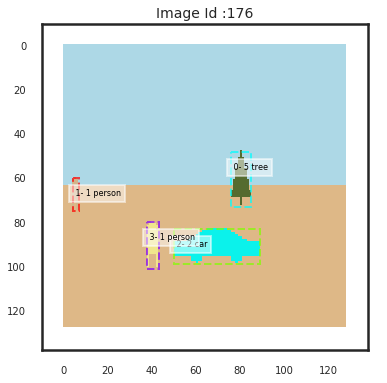

In [428]:
dataset_test.image_info[image_id]['shapes'] = save_shapes
vis.display_image_gt(dataset_test, dataset_test.config, image_id, size=6, verbose = True)


In [179]:
import copy 
save_shapes = copy.copy(dataset_test.image_info[29]['shapes'])
pp.pprint(save_shapes)

[ ('building', (48.0, 111.0, 114.0), (87, 50, 19, 15)),
  ('tree', (0.0, 128.0, 0.0), (17, 53, 6, 16)),
  ('car', (104.0, 52.0, 242.0), (68, 76, 17, 8)),
  ('car', (227.0, 95.0, 90.0), (80, 92, 20, 10))]


####  Modify image 29 -- 
     Remove building and tree and move cars above each other 

[ ('building', (48.0, 111.0, 114.0), (87, 50, 19, 15)),
  ('tree', (0.0, 128.0, 0.0), (17, 53, 6, 16)),
  ('car', (104.0, 52.0, 242.0), (68, 76, 17, 8)),
  ('car', (227.0, 95.0, 90.0), (80, 92, 20, 10))]
 Image_id    :  29  Reference:  [('building', (48.0, 111.0, 114.0), (87, 50, 19, 15)), ('tree', (0.0, 128.0, 0.0), (17, 53, 6, 16)), ('car', (104.0, 52.0, 242.0), (68, 76, 17, 8)), ('car', (227.0, 95.0, 90.0), (80, 92, 20, 10))] Coco Id: 29
 Image meta  :  [    29    128    128      3      0      0    128    128      1      1]
 Class ids   :  (4,)    [     4      5      2      2]
 Class Names :  ['building', 'tree', 'car', 'car']


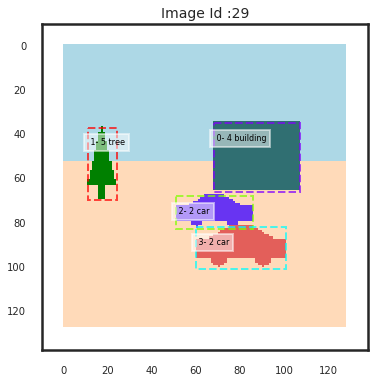

In [444]:
image_id = 29
save_shapes = copy.copy(dataset_test.image_info[image_id]['shapes'])
pp.pprint(save_shapes)
vis.display_image_gt(dataset_test, dataset_test.config, image_id, size=6, verbose = True)

[('car', (104.0, 52.0, 242.0), (68, 76, 17, 8)), ('car', (227.0, 95.0, 90.0), (80, 92, 20, 10))]
 Image_id    :  29  Reference:  [('car', (104.0, 52.0, 242.0), (68, 76, 17, 8)), ('car', (227.0, 95.0, 90.0), (80, 92, 20, 10))] Coco Id: 29
 Image meta  :  [    29    128    128      3      0      0    128    128      1      1]
 Class ids   :  (2,)    [     2      2]
 Class Names :  ['car', 'car']


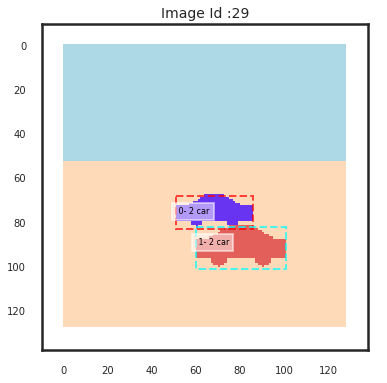

In [445]:
del dataset_test.image_info[29]['shapes'][0:2]
pp.pprint(dataset_test.image_info[29]['shapes'])
vis.display_image_gt(dataset_test, dataset_test.config, 29, size=6, verbose = True)

 Image_id    :  29  Reference:  [('car', (104.0, 52.0, 242.0), (80, 60, 15, 7)), ('car', (227.0, 95.0, 90.0), (80, 92, 20, 10))] Coco Id: 29
 Image meta  :  [    29    128    128      3      0      0    128    128      1      1]
 Class ids   :  (2,)    [     2      2]
 Class Names :  ['car', 'car']


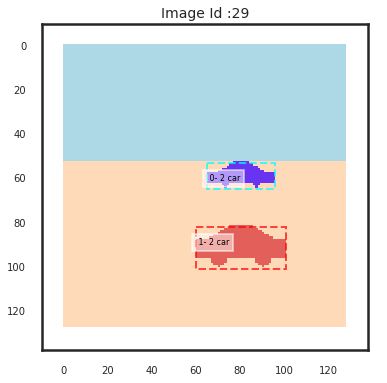

In [446]:
dataset_test.image_info[29]['shapes'][0] =  ('car', (104.0, 52.0, 242.0),(80, 60,15,7))
vis.display_image_gt(dataset_test, dataset_test.config, 29, size=6, verbose = True)

In [442]:
dataset_test.image_info[29]['shapes'] = save_shapes

vis.display_image_gt(dataset_test, dataset_test.config, 29, size=6, verbose = True)

In [19]:
np_format = {}
np_format['float']  = lambda x: "%10.4f" % x
np_format['int']    = lambda x: "%8d" % x
np.set_printoptions(linewidth=195, precision=4, floatmode='fixed', threshold =10000, formatter = np_format)

### Load weight file

In [90]:
FCN_DIR_WEIGHTS =  '/home/kbardool/models_newshapes2/train_fcn8L2_BCE1/fcn20190323T0000'
fcn_files  = ['fcn_0001.h5', 'fcn_0002.h5', 'fcn_0003.h5', 'fcn_0004.h5', 
          'fcn_0005.h5', 'fcn_0006.h5', 'fcn_0008.h5', 'fcn_0009.h5', 
          'fcn_0012.h5', 'fcn_0016.h5', 'fcn_0018.h5', 'fcn_0019.h5', 
          'fcn_0021.h5', 'fcn_0022.h5', 'fcn_0023.h5', 'fcn_0024.h5', 
          'fcn_0033.h5', 'fcn_0039.h5', 'fcn_0042.h5', 'fcn_0044.h5', 
          'fcn_0077.h5', 'fcn_0089.h5', 'fcn_0170.h5', 'fcn_0177.h5',
          'fcn_0253.h5', 'fcn_0266.h5']  ## 22,23,24,25

FILE_IDX = 2    ## fcn_0003
FILE_IDX = 5    ## fcn_0006
FILE_IDX = 13   ## fcn_0022
FILE_IDX = 18   ## fcn_0042
FILE_IDX = 21   ## fcn_0089
FILE_IDX = 22   ## fcn_0170
FILE_IDX = 24   ## fcn_0253
weights_file = os.path.join(FCN_DIR_WEIGHTS  , fcn_files[FILE_IDX])
print("Loading weights ", weights_file)
fcn_model.load_model_weights(weights_file)

Loading weights  /home/kbardool/models_newshapes2/train_fcn8L2_BCE1/fcn20190323T0000/fcn_0253.h5
-----------------------------------------------
 Load Model with init parm: [ /home/kbardool/models_newshapes2/train_fcn8L2_BCE1/fcn20190323T0000/fcn_0253.h5 ]
-----------------------------------------------
 ---> Explicit weight file
>>> load_weights() from : /home/kbardool/models_newshapes2/train_fcn8L2_BCE1/fcn20190323T0000/fcn_0253.h5
    Weights file loaded: /home/kbardool/models_newshapes2/train_fcn8L2_BCE1/fcn20190323T0000/fcn_0253.h5 
FCN  MODEL Load weight file COMPLETE 


 Image_id    :  67  Reference:  [('airplane', (215.0, 217.0, 161.0), (15, 15, 16, 6))] Coco Id: 67
 Image meta  :  [    67    128    128      3      0      0    128    128      1      1]
 Class ids   :  (1,)    [     7]
 Class Names :  ['airplane']


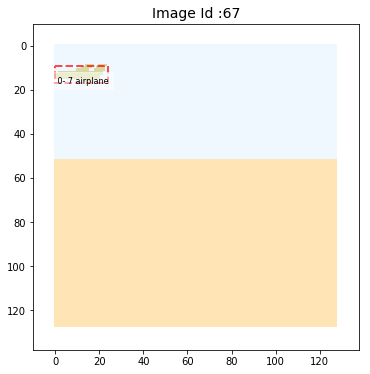

In [91]:
save_path = "/home/kbardool/git_projs/mrcnn3/train_newshapes_2/other"
NUM_CLASSES = 9
image_ids = [67]
IMGS = len(image_ids)
vis.display_image_gt(dataset_test, dataset_test.config, image_id, size=6, verbose = True)

Processing  1  images
 Image_id    :  67  Reference:  [('airplane', (215.0, 217.0, 161.0), (15, 15, 16, 6))] Coco Id: 67
 Image meta  :  [    67    128    128      3      0      0    128    128      1      1]
 Class ids   :  (1,)    [     7]
 Class Names :  ['airplane']


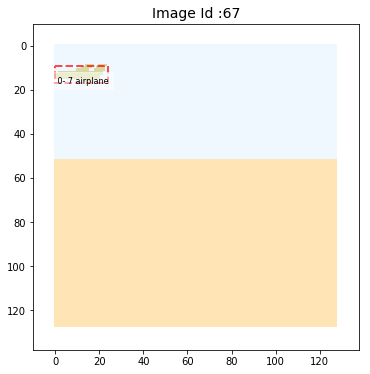

In [88]:
del dataset_test.image_info[image_id]['shapes'][0:20]
new_obj = ('airplane', (215.0, 217.0, 161.0), (15, 15, 16, 6))
dataset_test.image_info[image_id]['shapes'].append(new_obj)
print('Processing ',IMGS,' images')
vis.display_image_gt(dataset_test, dataset_test.config, image_id, size=6, verbose = True)

# fcn_results = run_fcn_detection(fcn_model, mrcnn_model, dataset_test, image_id, verbose = True)  

## Load weight filenames

In [4]:
save_path = "/home/kbardool/git_projs/mrcnn3/train_newshapes_2/other"
FCN_DIR_WEIGHTS =  '/home/kbardool/models_newshapes2/train_fcn8L2_BCE1/fcn20190323T0000'
fcn_files  = ['fcn_0001.h5', 'fcn_0002.h5', 'fcn_0003.h5', 'fcn_0004.h5', 
          'fcn_0005.h5', 'fcn_0006.h5', 'fcn_0008.h5', 'fcn_0009.h5', 
          'fcn_0012.h5', 'fcn_0016.h5', 'fcn_0018.h5', 'fcn_0019.h5', 
          'fcn_0021.h5', 'fcn_0022.h5', 'fcn_0023.h5', 'fcn_0024.h5', 
          'fcn_0033.h5', 'fcn_0039.h5', 'fcn_0042.h5', 'fcn_0044.h5', 
          'fcn_0077.h5', 'fcn_0089.h5', 'fcn_0170.h5', 'fcn_0177.h5',
          'fcn_0253.h5', 'fcn_0266.h5']  ## 22,23,24,25
# 2,5,13,18,19,22,23,24

FILE_IDX = 2    ## fcn_0003
FILE_IDX = 5    ## fcn_0006
FILE_IDX = 13   ## fcn_0022
FILE_IDX = 18   ## fcn_0042
FILE_IDX = 21   ## fcn_0089
FILE_IDX = 22   ## fcn_0170
FILE_IDX = 24   ## fcn_0253
# weights_file = os.path.join(FCN_DIR_WEIGHTS  , fcn_files[FILE_IDX])
# print("Loading weights ", weights_file)
# fcn_model.load_model_weights(weights_file)

## Experiments

|Exp |Image     | Original Image | modifications |Conxtextual experiment
|----| :------- |:-------------- | :-------------|:------------------------------------------------------------------ 
| 1 | Image 18 | sun and truck | Remove sun, add building |  move truck around with and without a building present in the image
| 2 | image 67 | Buildings and car|                    | If we move a person around the activation "should" peak when it's in proper position with regards to the car.
| 3 | image 67 | Buildings and car| Remove all objects | and move an object of each class around in black, and in color. 
| 4 | Image 72 | sun and airplane | Remove sun         | move a car around the image, and move a truck around the image , comparing the results. Moving a truck should invoke higher activation than a car, since the cars do not cooccur with an airplane
| 5 | Image 77 | Sun, Airplane    | Remove sun         | move airplane around with and and without a {building, truck, car} present in the scene. The activation strength should increase when the building is absent
| 6 | Image 79 | Person, plane | Remove the plane | move a car around the image. Activation of the car should peak when it's in propoer position with regards to the person
| 7 | image 176| 2 persons, tree, car| Remove tree and persons | move a airplane around (car and airplane dont occur in same image - so the relatvie activation strength of the airplane, in proper position, should be higher when thecar is absent from the image
    
    - The max FCN activation of the person is close to the car
 

## Load and Display saved .npz file 

In [42]:
# def show_heatmaps(image_id, FILE_LIST, exp_desc):
def show_heatmaps(image_id, EPOCHS, exp_desc, classes = None, columns = 9 ):    
    for epochs in EPOCHS :
        load_file =  'exp2_i'+str(image_id)+'_e'+epochs+'_'+exp_desc+'.npz'
        filename  = os.path.join(save_path, load_file)
        if os.path.exists(filename):
            print('\n')
            print('-'*130)
            print('  input file: ', filename)
            loaddata = np.load(os.path.join(save_path, load_file))
            print('-'*130)
            print('\n')
        else: 
            print('file not found ', filename)
            continue 
    #     print('Agg heatmap Calcs complete for epoch:', epochs , ' (heatmap file:', load_file, ')')
        fcn_agg_hm         = loaddata['fcn_agg_hm']
        print(fcn_agg_hm.shape)
        fcn_agg_hm_clipped = loaddata['fcn_agg_hm_clipped']
        gt_cls_counts      = loaddata['gt_cls_counts']  
        dt_cls_counts      = loaddata['dt_cls_counts']      
        ttl = 'fcn hm - img '+str(image_id)+'  epoch:'+str(epochs) +'  '+ exp_desc 
#     vis2.display_fcn_input_1(vis2.normalize_fcn_hm(fcn_agg_hm), gt_cls_counts, dt_cls_counts, class_names, columns =7, title =  ttl + '- CLASS NORMALIZED ')
#     vis2.display_fcn_input_1(fcn_agg_hm_clipped, gt_cls_counts, dt_cls_counts, class_names, columns =7, title = ttl +'- CLIPPED TO 0 ')
#         vis2.display_fcn_input_1(fcn_agg_hm, gt_cls_counts, dt_cls_counts, class_names, columns = cols, title = ttl +'- RAW DATA ', norm = False)
        vis2.display_fcn_agg_heatmaps(vis2.normalize_fcn_hm(fcn_agg_hm), gt_cls_counts, dt_cls_counts, class_names, columns = columns, title = ttl +'- NORMALIZED PER CLASS ', classes = classes)
        vis2.display_fcn_agg_heatmaps(vis2.normalize_all(fcn_agg_hm), gt_cls_counts, dt_cls_counts, class_names, columns = columns, title = ttl +'- NORMALIZED ACROSS ALL CLASSES ', classes = classes)

In [44]:
def show_heatmaps_3d(image_id, EPOCHS, exp_desc, classes = None, columns = 9 ):    
    for epochs in EPOCHS :
        load_file =  'exp2_i'+str(image_id)+'_e'+epochs+'_'+exp_desc+'.npz'
        filename  = os.path.join(save_path, load_file)
        if os.path.exists(filename):
            print('\n')
            print('-'*130)
            print('  input file: ', filename)
            loaddata = np.load(os.path.join(save_path, load_file))
            print('-'*130)
            print('\n')
        else: 
            print('file not found ', filename)
            continue 

#     print('Agg heatmap Calcs complete for epoch:', epochs , ' (heatmap file:', load_file, ')')
        fcn_agg_hm         = loaddata['fcn_agg_hm']
        fcn_agg_hm_clipped = loaddata['fcn_agg_hm_clipped']
        gt_cls_counts      = loaddata['gt_cls_counts']  
        dt_cls_counts      = loaddata['dt_cls_counts']      
        ttl = 'fcn hm - img '+str(image_id)+'  epoch:'+str(epochs) +'  '+ exp_desc 
#     vis2.display_fcn_input_1(vis2.normalize_fcn_hm(fcn_agg_hm), gt_cls_counts, dt_cls_counts, class_names, columns =7, title =  ttl + '- CLASS NORMALIZED ')
#     vis2.display_fcn_input_1(fcn_agg_hm_clipped, gt_cls_counts, dt_cls_counts, class_names, columns =7, title = ttl +'- CLIPPED TO 0 ')
#     vis2.display_fcn_input_1(fcn_agg_hm, gt_cls_counts, dt_cls_counts, class_names, columns = cols, title = ttl +'- RAW DATA ', norm = False)
        vis2.display_fcn_agg_heatmaps_3d(vis2.normalize_fcn_hm(fcn_agg_hm), gt_cls_counts, dt_cls_counts, class_names, columns = columns, title = ttl +'- NORMALIZED PER CLASS ', classes = classes)
        vis2.display_fcn_agg_heatmaps_3d(vis2.normalize_all(fcn_agg_hm), gt_cls_counts, dt_cls_counts, class_names, columns = columns, title = ttl +'- NORMALIZED ACROSS ALL CLASSES ', classes = classes)

In [41]:
def show_heatmaps2(image_id, FILE_LIST, exp_desc, classes = None, columns = 9 ):
    # FILE_LIST = [17]
    # FILE_LIST = [17,18,21,22,23,24,25]
    for FILE_IDX in FILE_LIST :
        epochs = fcn_files[FILE_IDX].split('_')[1].replace('.h5','')
        print('epochs = ', epochs)
        load_file =  'exp2_img_'+str(image_id)+'_epoch_'+epochs+'.npz'
        filename  = os.path.join(save_path, load_file)
        if os.path.exists(filename):
            print('\n')
            print('-'*130)
            print('  input file: ', filename)
            loaddata = np.load(os.path.join(save_path, load_file))
            print('-'*130)
            print('\n')
        else: 
            print('file not found ', filename)
            continue 
    #     print('Agg heatmap Calcs complete for epoch:', epochs , ' (heatmap file:', load_file, ')')
        
        fcn_agg_hm         = loaddata['fcn_agg_hm']
        fcn_agg_hm_clipped = loaddata['fcn_agg_hm_clipped']
        gt_cls_counts      = loaddata['gt_cls_counts']  
        dt_cls_counts      = loaddata['dt_cls_counts']      
        
        ttl = 'fcn hm - img '+str(image_id)+'  epoch:'+str(epochs) +'  '+ exp_desc 
    #     vis2.display_fcn_input_1(vis2.normalize_fcn_hm(fcn_agg_hm), gt_cls_counts, dt_cls_counts, class_names, columns =7, title =  ttl + '- CLASS NORMALIZED ')
    #     vis2.display_fcn_input_1(fcn_agg_hm_clipped, gt_cls_counts, dt_cls_counts, class_names, columns =7, title = ttl +'- CLIPPED TO 0 ')
        vis2.display_fcn_agg_heatmaps(fcn_agg_hm, gt_cls_counts, dt_cls_counts, class_names, columns = cols, title = ttl +'- RAW DATA ', classes = [1,2,3,4,5,6,7,8])
        vis2.display_fcn_agg_heatmaps(vis2.normalize_fcn_hm(fcn_agg_hm), gt_cls_counts, dt_cls_counts, class_names, columns = columns, title = ttl +'- NORMALIZED PER CLASS ', classes = classes)
        vis2.display_fcn_agg_heatmaps(vis2.normalize_all(fcn_agg_hm), gt_cls_counts, dt_cls_counts, class_names, columns = columns, title = ttl +'- NORMALIZED ACROSS ALL CLASSES ', classes = classes)

###  Image 77 - Airplane movement around image 



----------------------------------------------------------------------------------------------------------------------------------
  input file:  /home/kbardool/git_projs/mrcnn3/train_newshapes_2/other/exp2_i77_e0089_airp_mvmt.npz
----------------------------------------------------------------------------------------------------------------------------------


(128, 128, 9)


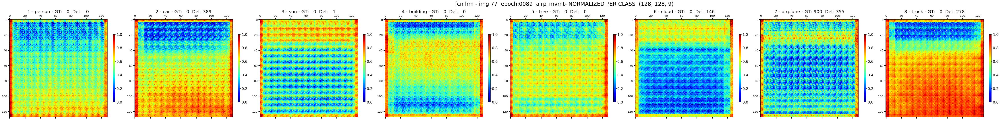

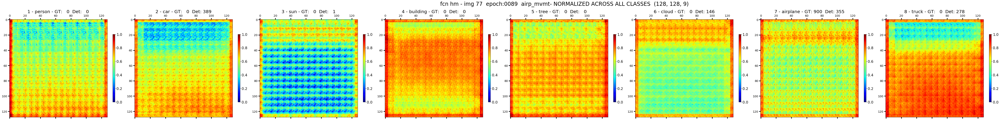



----------------------------------------------------------------------------------------------------------------------------------
  input file:  /home/kbardool/git_projs/mrcnn3/train_newshapes_2/other/exp2_i77_e0089_airp_mvmt_w_bldg.npz
----------------------------------------------------------------------------------------------------------------------------------


(128, 128, 9)


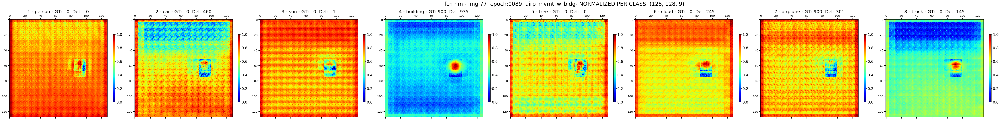

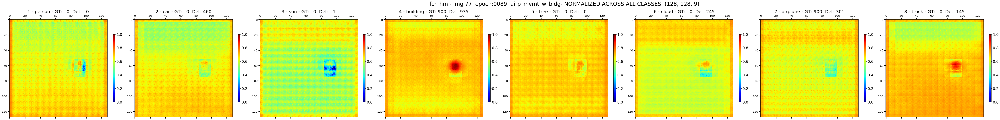



----------------------------------------------------------------------------------------------------------------------------------
  input file:  /home/kbardool/git_projs/mrcnn3/train_newshapes_2/other/exp2_i77_e0089_airp_mvmt_w_truck.npz
----------------------------------------------------------------------------------------------------------------------------------


(128, 128, 9)


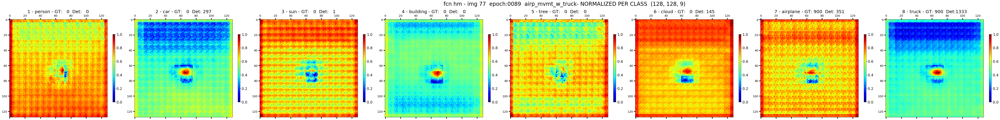

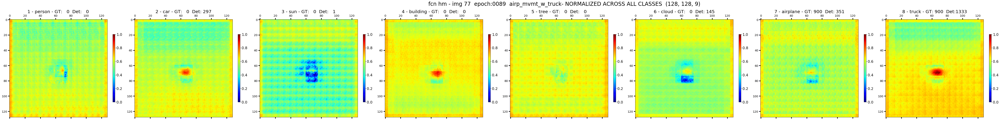



----------------------------------------------------------------------------------------------------------------------------------
  input file:  /home/kbardool/git_projs/mrcnn3/train_newshapes_2/other/exp2_i77_e0089_airp_mvmt_w_car.npz
----------------------------------------------------------------------------------------------------------------------------------


(128, 128, 9)


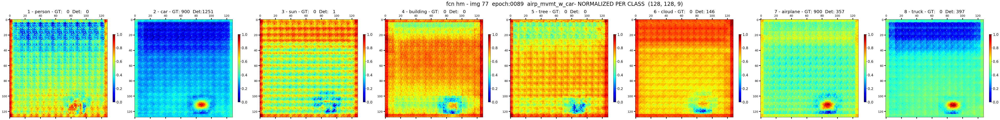

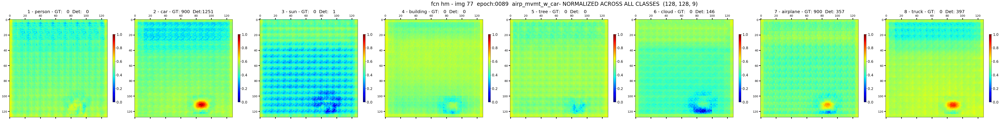

In [30]:
FILE_LIST = ['0089']
# FILE_LIST = [17,18,21,22,23,24,25]
classes = [1,2,3,4,5,6,7,8]
show_heatmaps(77, FILE_LIST, 'airp_mvmt', classes = classes)
show_heatmaps(77, FILE_LIST, 'airp_mvmt_w_bldg', classes = classes)
show_heatmaps(77, FILE_LIST, 'airp_mvmt_w_truck', classes = classes)
show_heatmaps(77, FILE_LIST, 'airp_mvmt_w_car', classes = classes)

###  Image 79 - Person stationary, car moved around image 



----------------------------------------------------------------------------------------------------------------------------------
  input file:  /home/kbardool/git_projs/mrcnn3/train_newshapes_2/other/exp2_i79_e0266_car_mvmt_w_prsn.npz
----------------------------------------------------------------------------------------------------------------------------------


(128, 128, 9)


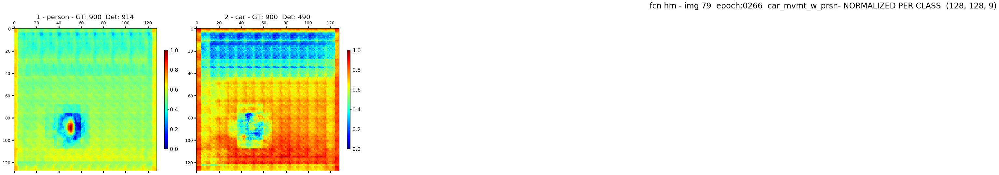

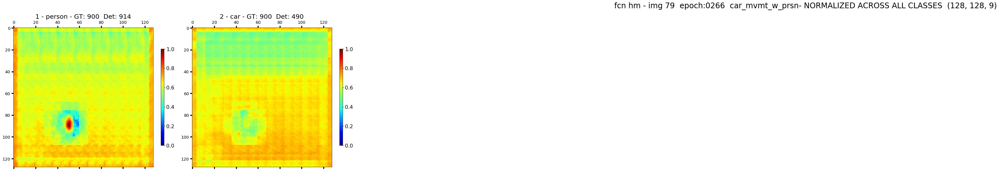

In [46]:
image_id = 79
# FILE_LIST = [18]
FILE_LIST = ['0266']   #17,18,21,22,24]
show_heatmaps(image_id, FILE_LIST, 'car_mvmt_w_prsn', classes =[ 1,2])



----------------------------------------------------------------------------------------------------------------------------------
  input file:  /home/kbardool/git_projs/mrcnn3/train_newshapes_2/other/exp2_i79_e0266_car_mvmt_w_prsn.npz
----------------------------------------------------------------------------------------------------------------------------------




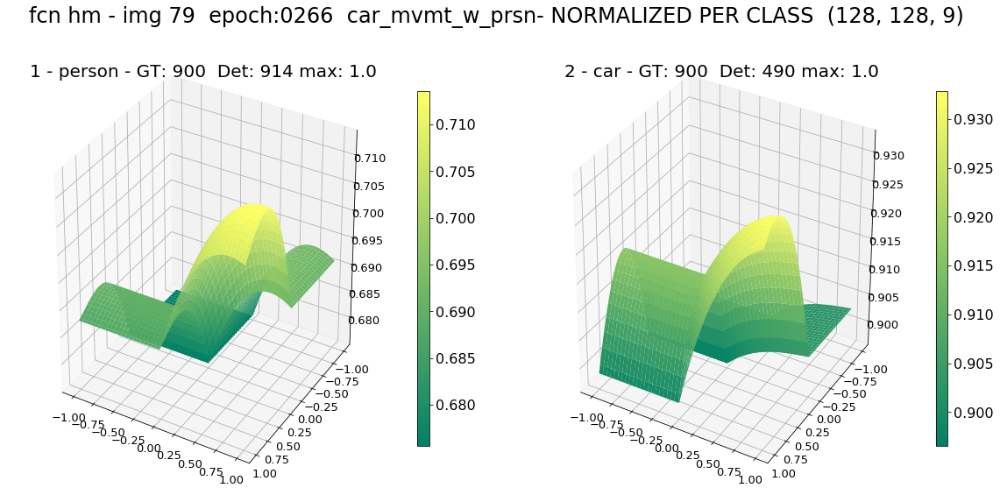

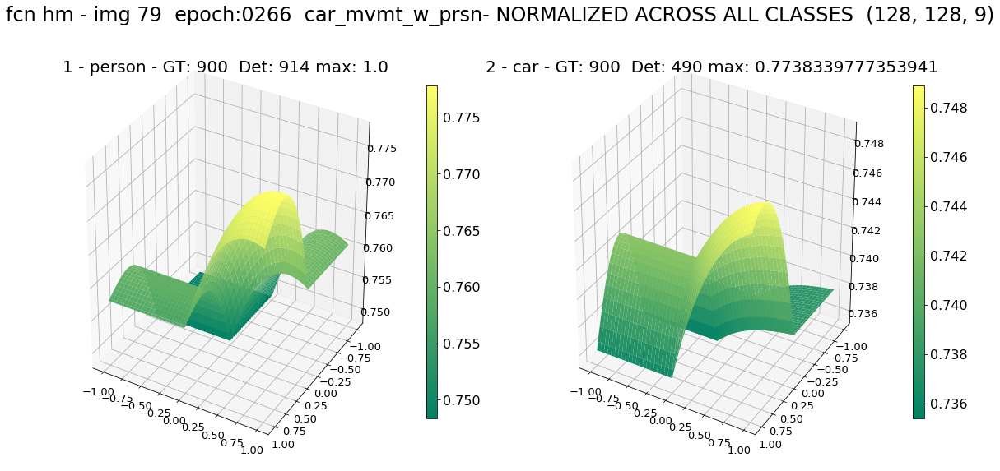

In [66]:
show_heatmaps_3d(image_id, FILE_LIST, 'car_mvmt_w_prsn', classes = [1,2], columns = 2)

###  Image 18 - Move sun around image



----------------------------------------------------------------------------------------------------------------------------------
  input file:  /home/kbardool/git_projs/mrcnn3/train_newshapes_2/other/exp2_i18_e0253_sun_mvmt.npz
----------------------------------------------------------------------------------------------------------------------------------




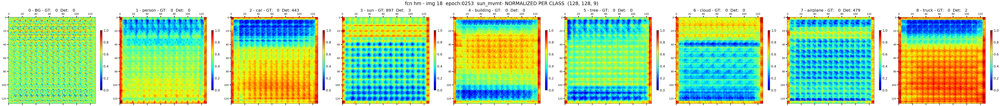

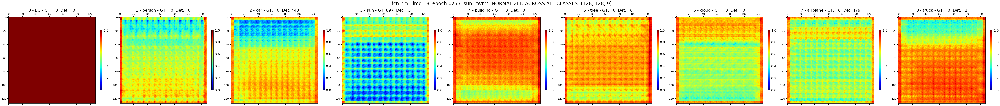

In [26]:
# FILE_LIST = [18]
FILE_LIST = [2,5,13,18,21,22,24]
FILE_LIST = ['0253']
show_heatmaps(18, FILE_LIST, 'sun_mvmt')

### Image 77 - Airplane moved around image with no other object present 



----------------------------------------------------------------------------------------------------------------------------------
  input file:  /home/kbardool/git_projs/mrcnn3/train_newshapes_2/other/exp2_i77_e0042_airp_mvmt.npz
----------------------------------------------------------------------------------------------------------------------------------




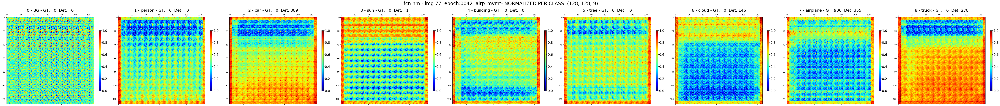

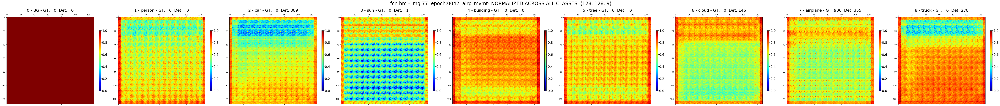

In [93]:
cols = 9
image_id = 77
exp_desc = 'airp_mvmt'

# FILE_LIST = [21]
# FILE_LIST = [17,18,21,22,23,24,25]
for FILE_IDX in FILE_LIST :
    epochs = fcn_files[FILE_IDX].split('_')[1].replace('.h5','')
    load_file =  'exp2_i'+str(image_id)+'_e'+epochs+'_'+exp_desc+'.npz'
    filename  = os.path.join(save_path, load_file)
    if os.path.exists(filename):
        print('\n')
        print('-'*130)
        print('  input file: ', filename)
        loaddata = np.load(os.path.join(save_path, load_file))
        print('-'*130)
        print('\n')
    else: 
        print('file not found ', filename)
        continue 
#     print('Agg heatmap Calcs complete for epoch:', epochs , ' (heatmap file:', load_file, ')')
    fcn_agg_hm         = loaddata['fcn_agg_hm']
    fcn_agg_hm_clipped = loaddata['fcn_agg_hm_clipped']
    gt_cls_counts      = loaddata['gt_cls_counts']  
    dt_cls_counts      = loaddata['dt_cls_counts']      
    ttl = 'fcn hm - img '+str(image_id)+'  epoch:'+str(epochs) +'  '+ exp_desc 

#     vis2.display_fcn_input_1(vis2.normalize_fcn_hm(fcn_agg_hm), gt_cls_counts, dt_cls_counts, class_names, columns =7, title =  ttl + '- CLASS NORMALIZED ')
#     vis2.display_fcn_input_1(fcn_agg_hm_clipped, gt_cls_counts, dt_cls_counts, class_names, columns =7, title = ttl +'- CLIPPED TO 0 ')
#     vis2.display_fcn_input_1(fcn_agg_hm, gt_cls_counts, dt_cls_counts, class_names, columns = cols, title = ttl +'- RAW DATA ')
    vis2.display_fcn_input_1(vis2.normalize_fcn_hm(fcn_agg_hm), gt_cls_counts, dt_cls_counts, class_names, columns = cols, title = ttl +'- NORMALIZED PER CLASS ')
    vis2.display_fcn_input_1(vis2.normalize_all(fcn_agg_hm), gt_cls_counts, dt_cls_counts, class_names, columns = cols, title = ttl +'- NORMALIZED ACROSS ALL CLASSES ')


### Image 77 - Airplane moved around image with building present 



----------------------------------------------------------------------------------------------------------------------------------
  input file:  /home/kbardool/git_projs/mrcnn3/train_newshapes_2/other/exp2_i77_e0042_airp_mvmt_w_bldg.npz
----------------------------------------------------------------------------------------------------------------------------------




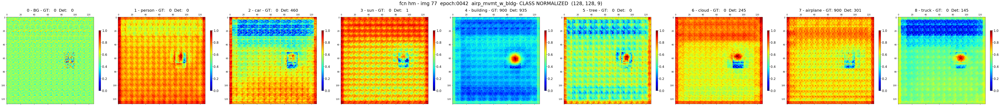

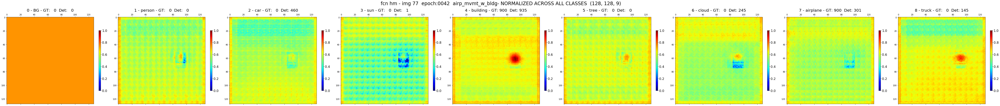

In [94]:
cols = 9 
image_id = 77
exp_desc = 'airp_mvmt_w_bldg'
# FILE_LIST = [17]
# FILE_LIST = [17,18,21,22,23,24,25]
for FILE_IDX in FILE_LIST :
    epochs = fcn_files[FILE_IDX].split('_')[1].replace('.h5','')
    load_file =  'exp2_i'+str(image_id)+'_e'+epochs+'_'+exp_desc+'.npz'
    filename  = os.path.join(save_path, load_file)
    if os.path.exists(filename):
        print('\n')
        print('-'*130)
        print('  input file: ', filename)
        loaddata = np.load(os.path.join(save_path, load_file))
        print('-'*130)
        print('\n')
    else: 
        print('file not found ', filename)
        continue 
    fcn_agg_hm         = loaddata['fcn_agg_hm']
    fcn_agg_hm_clipped = loaddata['fcn_agg_hm_clipped']
    gt_cls_counts      = loaddata['gt_cls_counts']  
    dt_cls_counts      = loaddata['dt_cls_counts']      
    ttl = 'fcn hm - img '+str(image_id)+'  epoch:'+str(epochs) +'  '+ exp_desc 
#     vis2.display_fcn_input_1(fcn_agg_hm, gt_cls_counts, dt_cls_counts, class_names, columns = cols, title = ttl +'- RAW DATA ')
    vis2.display_fcn_input_1(vis2.normalize_fcn_hm(fcn_agg_hm), gt_cls_counts, dt_cls_counts, class_names, columns = cols, title =  ttl + '- CLASS NORMALIZED ')
    vis2.display_fcn_input_1(vis2.normalize_all(fcn_agg_hm), gt_cls_counts, dt_cls_counts, class_names, columns = cols, title = ttl +'- NORMALIZED ACROSS ALL CLASSES ')

### Image 77 - Airplane moved around image with truck present in image



----------------------------------------------------------------------------------------------------------------------------------
  input file:  /home/kbardool/git_projs/mrcnn3/train_newshapes_2/other/exp2_i77_e0042_airp_mvmt_w_truck.npz
----------------------------------------------------------------------------------------------------------------------------------




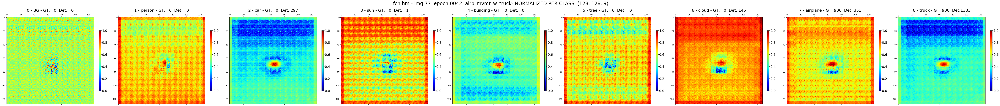

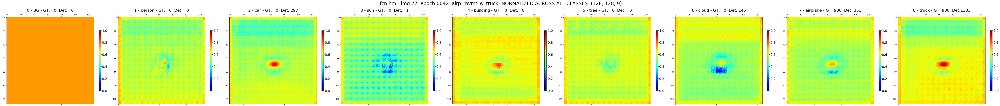

In [95]:
cols = 9 
image_id = 77
exp_desc = 'airp_mvmt_w_truck'

# FILE_LIST = [17]
# FILE_LIST = [17,18,21,22,23,24,25]
for FILE_IDX in FILE_LIST :
    epochs = fcn_files[FILE_IDX].split('_')[1].replace('.h5','')
    load_file =  'exp2_i'+str(image_id)+'_e'+epochs+'_'+exp_desc+'.npz'
    filename  = os.path.join(save_path, load_file)
    if os.path.exists(filename):
        print('\n')
        print('-'*130)
        print('  input file: ', filename)
        loaddata = np.load(os.path.join(save_path, load_file))
        print('-'*130)
        print('\n')
    else: 
        print('file not found ', filename)
        continue 
#     print('Agg heatmap Calcs complete for epoch:', epochs , ' (heatmap file:', load_file, ')')
    fcn_agg_hm         = loaddata['fcn_agg_hm']
    fcn_agg_hm_clipped = loaddata['fcn_agg_hm_clipped']
    gt_cls_counts      = loaddata['gt_cls_counts']  
    dt_cls_counts      = loaddata['dt_cls_counts']      
    ttl = 'fcn hm - img '+str(image_id)+'  epoch:'+str(epochs) +'  '+ exp_desc 
#     vis2.display_fcn_input_1(vis2.normalize_fcn_hm(fcn_agg_hm), gt_cls_counts, dt_cls_counts, class_names, columns =7, title =  ttl + '- CLASS NORMALIZED ')
#     vis2.display_fcn_input_1(fcn_agg_hm_clipped, gt_cls_counts, dt_cls_counts, class_names, columns =7, title = ttl +'- CLIPPED TO 0 ')
#     vis2.display_fcn_input_1(fcn_agg_hm, gt_cls_counts, dt_cls_counts, class_names, columns = cols, title = ttl +'- RAW DATA ')
    vis2.display_fcn_input_1(vis2.normalize_fcn_hm(fcn_agg_hm), gt_cls_counts, dt_cls_counts, class_names, columns = cols, title = ttl +'- NORMALIZED PER CLASS ')
    vis2.display_fcn_input_1(vis2.normalize_all(fcn_agg_hm), gt_cls_counts, dt_cls_counts, class_names, columns = cols, title = ttl +'- NORMALIZED ACROSS ALL CLASSES ')
    

### Image 77 - Airplane moved around image with ___



----------------------------------------------------------------------------------------------------------------------------------
  input file:  /home/kbardool/git_projs/mrcnn3/train_newshapes_2/other/exp2_i77_e0089_airp_mvmt_wo_bldg.npz
----------------------------------------------------------------------------------------------------------------------------------




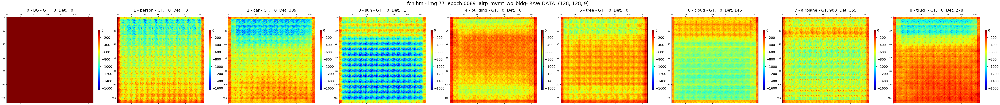

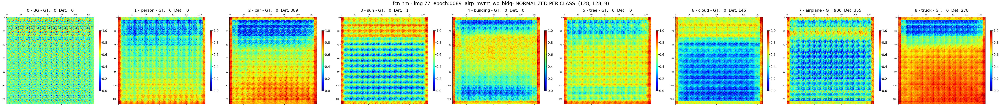

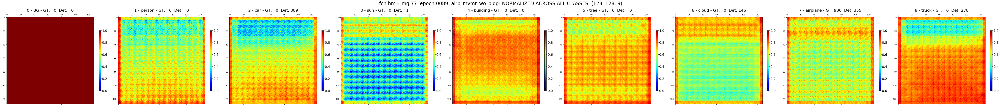

In [80]:
cols = 9
image_id = 77
exp_desc = 'airp_mvmt_'

FILE_LIST = [21]
# FILE_LIST = [17,18,21,22,23,24,25]
for FILE_IDX in FILE_LIST :
    epochs = fcn_files[FILE_IDX].split('_')[1].replace('.h5','')
    load_file =  'exp2_i'+str(image_id)+'_e'+epochs+'_'+exp_desc+'.npz'
    filename  = os.path.join(save_path, load_file)
    if os.path.exists(filename):
        print('\n')
        print('-'*130)
        print('  input file: ', filename)
        loaddata = np.load(os.path.join(save_path, load_file))
        print('-'*130)
        print('\n')
    else: 
        print('file not found ', filename)
        continue 
#     print('Agg heatmap Calcs complete for epoch:', epochs , ' (heatmap file:', load_file, ')')
    fcn_agg_hm         = loaddata['fcn_agg_hm']
    fcn_agg_hm_clipped = loaddata['fcn_agg_hm_clipped']
    gt_cls_counts      = loaddata['gt_cls_counts']  
    dt_cls_counts      = loaddata['dt_cls_counts']      
    ttl = 'fcn hm - img '+str(image_id)+'  epoch:'+str(epochs) +'  '+ exp_desc 

#     vis2.display_fcn_input_1(vis2.normalize_fcn_hm(fcn_agg_hm), gt_cls_counts, dt_cls_counts, class_names, columns =7, title =  ttl + '- CLASS NORMALIZED ')
#     vis2.display_fcn_input_1(fcn_agg_hm_clipped, gt_cls_counts, dt_cls_counts, class_names, columns =7, title = ttl +'- CLIPPED TO 0 ')
    vis2.display_fcn_input_1(fcn_agg_hm, gt_cls_counts, dt_cls_counts, class_names, columns = cols, title = ttl +'- RAW DATA ')
    vis2.display_fcn_input_1(vis2.normalize_fcn_hm(fcn_agg_hm), gt_cls_counts, dt_cls_counts, class_names, columns = cols, title = ttl +'- NORMALIZED PER CLASS ')
    vis2.display_fcn_input_1(vis2.normalize_all(fcn_agg_hm), gt_cls_counts, dt_cls_counts, class_names, columns = cols, title = ttl +'- NORMALIZED ACROSS ALL CLASSES ')


## Display FCN output heatmaps for one file

In [387]:
# epochs = files[FILE_IDX].split('_')[1].replace('.h5','')
epochs = '0266'
image_id =  176
load_file =  'exp2_img'+'_'+str(image_id)+'_epoch_'+epochs+'.npz'
print(heatmaps_file)
print('  input file: ',os.path.join(save_path, load_file))

exp2_epoch_0266_img_176.npz
  input file:  /home/kbardool/git_projs/mrcnn3/train_newshapes_2/other/exp2_img_176_epoch_0266.npz


In [390]:
loaddata = np.load(os.path.join(save_path, load_file))
# print(type(loaddata))
# print(loaddata.keys)
# print(type(loaddata['gt_ttl_img_by_inst']),'  ', type(loaddata['gt_ttl_img_by_inst'][0]))

# gt_cls_counts      = loaddata['gt_cls_counts']  
# dt_cls_counts      = loaddata['dt_cls_counts']  
# imgs_one_gt        = loaddata['imgs_one_gt']  
# imgs_one_dt        = loaddata['imgs_one_dt'] 
# gt_ttl_img_by_inst = loaddata['gt_ttl_img_by_inst']
# dt_ttl_img_by_inst = loaddata['dt_ttl_img_by_inst']
# sav_pr_min         = loaddata['sav_pr_min'] 
# sav_pr_max         = loaddata['sav_pr_max']  
# sav_fcn_min        = loaddata['sav_fcn_min']
# sav_fcn_max        = loaddata['sav_fcn_max']
# pr_agg_hm          = loaddata['pr_agg_hm']
# pr_agg_hm_clipped  = loaddata['pr_agg_hm_clipped']
fcn_agg_hm         = loaddata['fcn_agg_hm']
fcn_agg_hm_clipped = loaddata['fcn_agg_hm_clipped']

print('Agg heatmap Calcs complete for epoch:', epochs , ' (heatmap file:', load_file, ')')
# display_results(loaddata)

Agg heatmap Calcs complete for epoch: 0266  (heatmap file: exp2_img_176_epoch_0266.npz )

 Final Results:
---------------
  pr_hm MIN:      0.00000      MAX:      1.00000
 fcn_hm MIN:     -5.39373      MAX:      1.62916

 images with one gt object: 0   one detection from MR-CNN: 20
 Ground Truth by class    : [     0    961    961      0      0      0      0      0      0]
 Detections by class      : [     0    959    970    251      0     46      0      0      6]

 Original Heatmap:
 ----------------
    pr_hm mins:  [    0.0000     0.0000     0.0000     0.0000     0.0000     0.0000     0.0000     0.0000     0.0000]
          maxs:  [    0.0000     3.4073   923.9503     3.9395     0.0000     3.2247     0.0000     0.0000     5.4793]

   fcn_hm mins:  [   -0.0000 -1740.9845 -1527.5998 -2045.3900 -1618.4484 -1705.7219 -1571.4869 -1667.5775 -1818.4751]
          maxs:  [    0.0000    -3.6481  1240.3007  -110.5703   -29.3917    -1.3002  -102.8233   731.3356   701.5903]

   pr_hm sums :  [ 

0

## Display Heatmaps

In [214]:
# hmfig = vis2.display_pairwise_heatmap(gt_ttl_img_by_inst, [0,1,2,3,4,5,6,7,8], class_names)

### mask_rcnn output

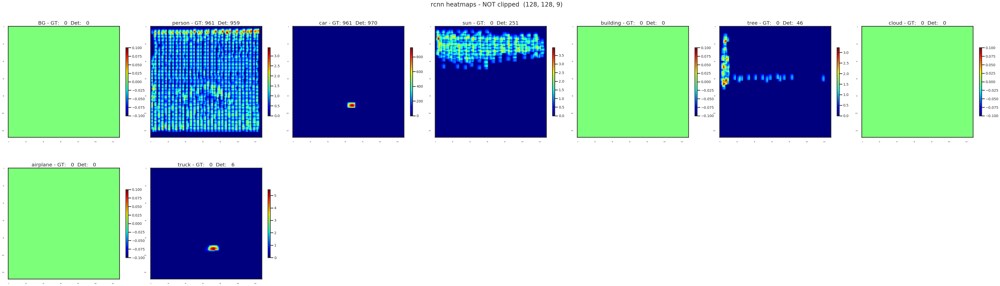

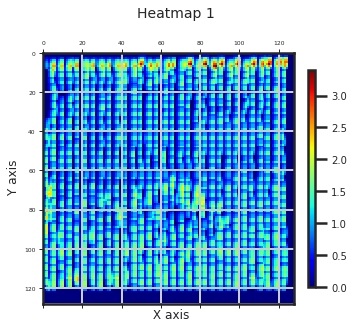

In [372]:
vis2.display_fcn_input_1(pr_agg_hm, gt_cls_counts, dt_cls_counts, class_names, cmap = 'jet', columns = 7, title = 'rcnn heatmaps - NOT clipped ')
vis.plot_2d_gaussian(pr_agg_hm[:,:,1], size =(5,5), title = 'MRCNN produced heatmap')

### mask_rcnn output - normalized

(128, 128, 9)


../mrcnn/visualize_2.py:692: RuntimeWarning: invalid value encountered in true_divide
  out /= (x.max(axis=(0,1), keepdims = True) - x.min(axis=(0,1), keepdims = True))


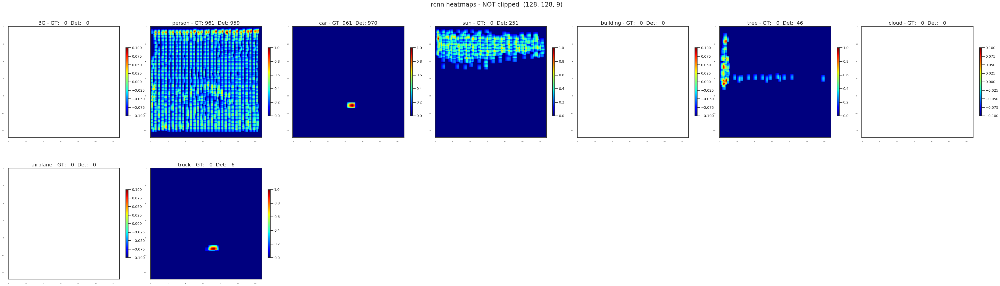

(128, 128)


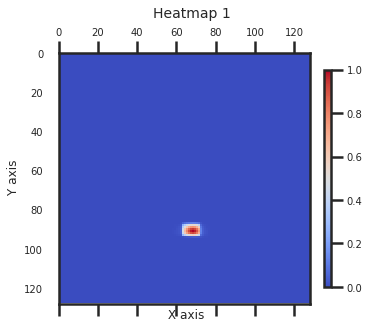

In [357]:
vis2.display_fcn_input_1(vis2.normalize_fcn_hm(pr_agg_hm), gt_cls_counts, dt_cls_counts, class_names, cmap = 'jet', columns = 7, title = 'rcnn heatmaps - NOT clipped ')
vis.plot_2d_gaussian(vis2.normalize_fcn_hm(pr_agg_hm[:,:,2]), size =(5,5))

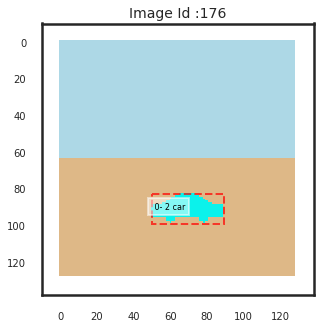

In [341]:
vis.display_image_gt(dataset_test, dataset_test.config, image_id , size = 5, verbose = False)   

### mask_rcnn output - standarize and clip

(128, 128, 9)


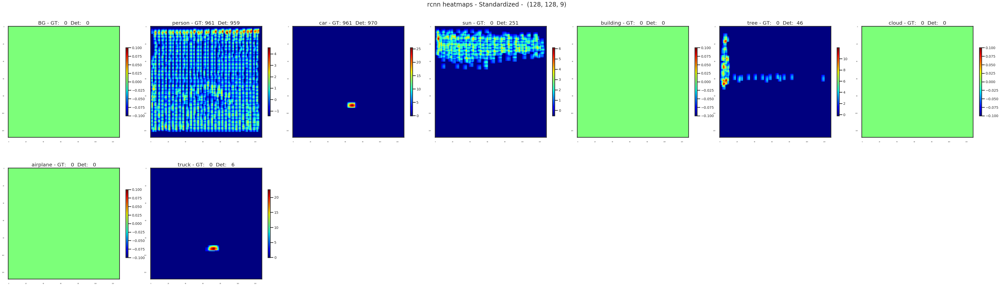

(128, 128, 9)


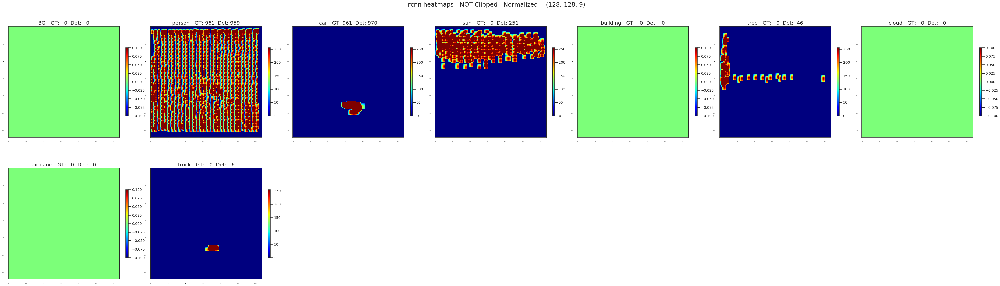

In [342]:
vis2.display_fcn_input_1(vis2.standardize_fcn_hm(pr_agg_hm), gt_cls_counts, dt_cls_counts, class_names, cmap = 'jet', columns = 7, title = 'rcnn heatmaps - Standardized - ')
vis2.display_fcn_input_1(vis2.deprocess_image(pr_agg_hm), gt_cls_counts, dt_cls_counts, class_names, cmap = 'jet', columns = 7, title = 'rcnn heatmaps - NOT Clipped - Normalized - ')

###  mask_rcnn clipped  
(pr_agg_hm_clipped is same as pr_agg_hm since the ouptut of R-CNN is [0,1]

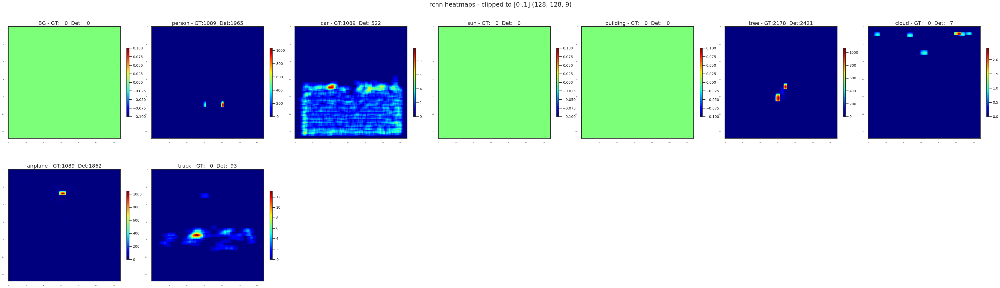

In [293]:
vis2.display_fcn_input_1(pr_agg_hm_clipped, gt_cls_counts, dt_cls_counts, class_names , cmap = 'jet', columns = 7, title = 'rcnn heatmaps - clipped to [0 ,1]')

(128, 128, 9)


../mrcnn/visualize_2.py:692: RuntimeWarning: invalid value encountered in true_divide
  out /= (x.max(axis=(0,1), keepdims = True) - x.min(axis=(0,1), keepdims = True))


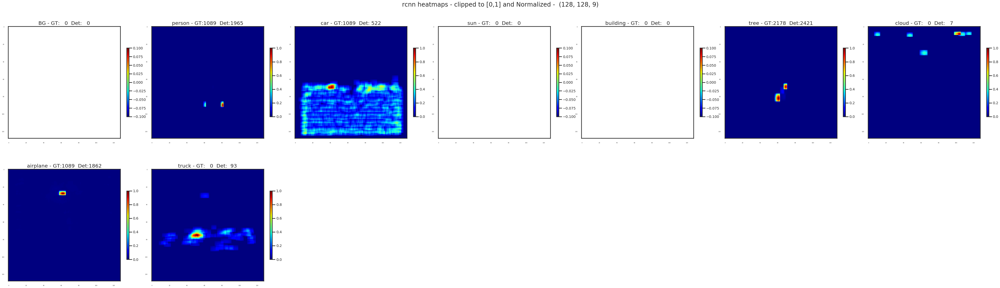

In [272]:
vis2.display_fcn_input_1(vis2.normalize_fcn_hm(pr_agg_hm_clipped), gt_cls_counts, dt_cls_counts, class_names, cmap = 'jet', columns = 7, title = 'rcnn heatmaps - clipped to [0,1] and Normalized - ')

(128, 128, 9)


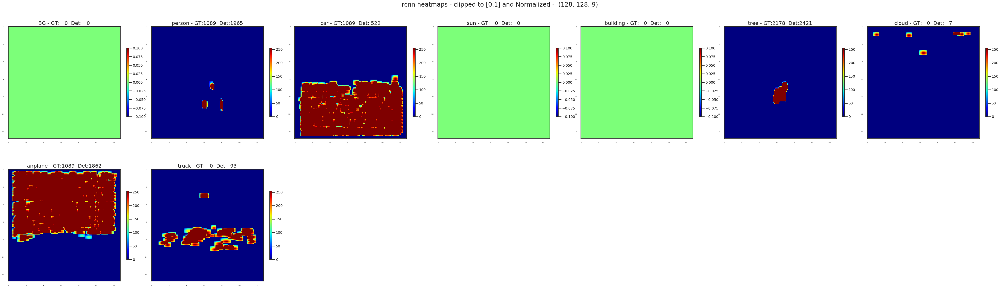

In [273]:
vis2.display_fcn_input_1(vis2.deprocess_image(pr_agg_hm_clipped), gt_cls_counts, dt_cls_counts, class_names, cmap = 'jet', columns = 7, title = 'rcnn heatmaps - clipped to [0,1] and Normalized - ')

###  fcn

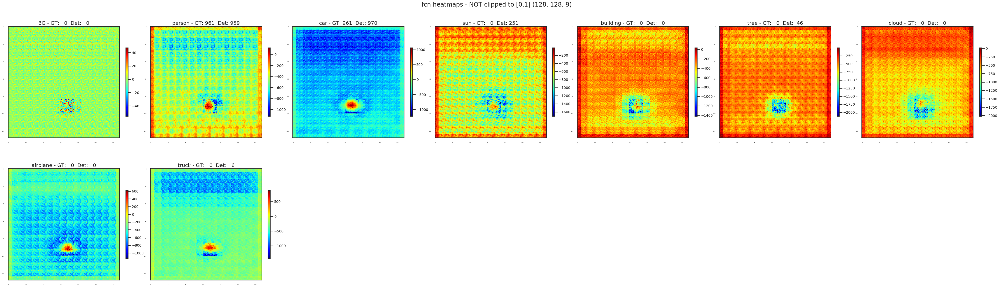

(128, 128)


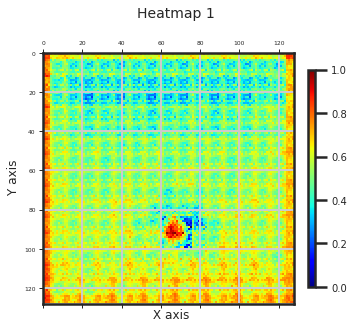

(128, 128)


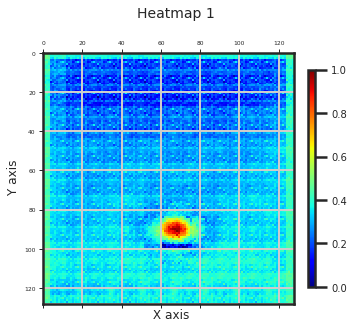

In [365]:
vis2.display_fcn_input_1(fcn_agg_hm, gt_cls_counts, dt_cls_counts, class_names, cmap = 'jet', columns =7, title = 'fcn heatmaps - NOT clipped to [0,1]')
vis.plot_2d_gaussian(vis2.normalize_fcn_hm(fcn_agg_hm[:,:,1]), size =(5,5))
vis.plot_2d_gaussian(vis2.normalize_fcn_hm(fcn_agg_hm[:,:,2]), size =(5,5))

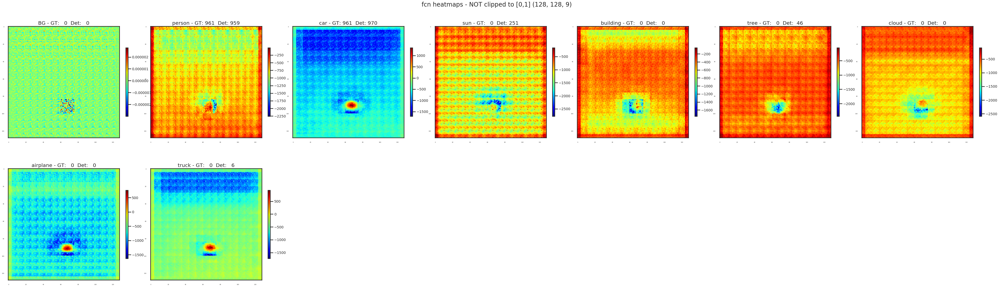

(128, 128)


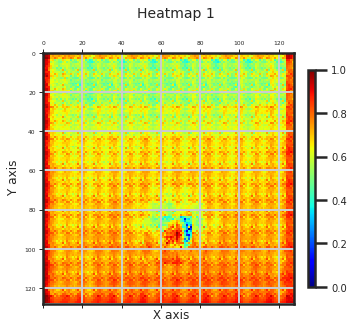

(128, 128)


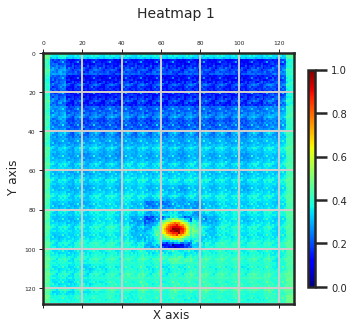

In [381]:
vis2.display_fcn_input_1(fcn_agg_hm, gt_cls_counts, dt_cls_counts, class_names, cmap = 'jet', columns =7, title = 'fcn heatmaps - NOT clipped to [0,1]')
vis.plot_2d_gaussian(vis2.normalize_fcn_hm(fcn_agg_hm[:,:,1]), size =(5,5))
vis.plot_2d_gaussian(vis2.normalize_fcn_hm(fcn_agg_hm[:,:,2]), size =(5,5))

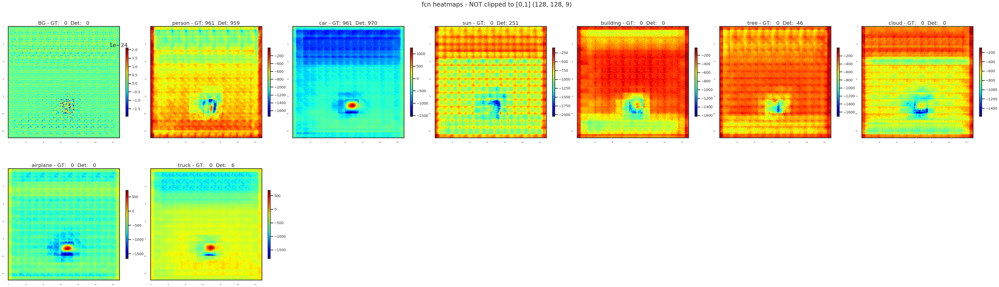

(128, 128)


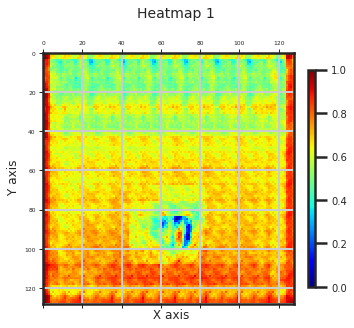

(128, 128)


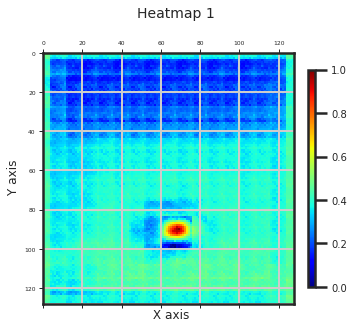

In [391]:
vis2.display_fcn_input_1(fcn_agg_hm, gt_cls_counts, dt_cls_counts, class_names, cmap = 'jet', columns =7, title = 'fcn heatmaps - NOT clipped to [0,1]')
vis.plot_2d_gaussian(vis2.normalize_fcn_hm(fcn_agg_hm[:,:,1]), size =(5,5))
vis.plot_2d_gaussian(vis2.normalize_fcn_hm(fcn_agg_hm[:,:,2]), size =(5,5))

### fcn normalized

(128, 128, 9)


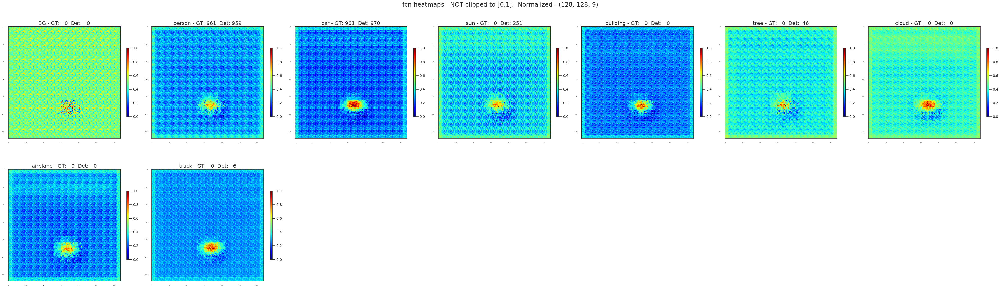

In [344]:
vis2.display_fcn_input_1(vis2.normalize_fcn_hm(fcn_agg_hm), gt_cls_counts, dt_cls_counts, class_names, cmap = 'jet', columns = 7, title = 'fcn heatmaps - NOT clipped to [0,1],  Normalized -')

### fcn clipped

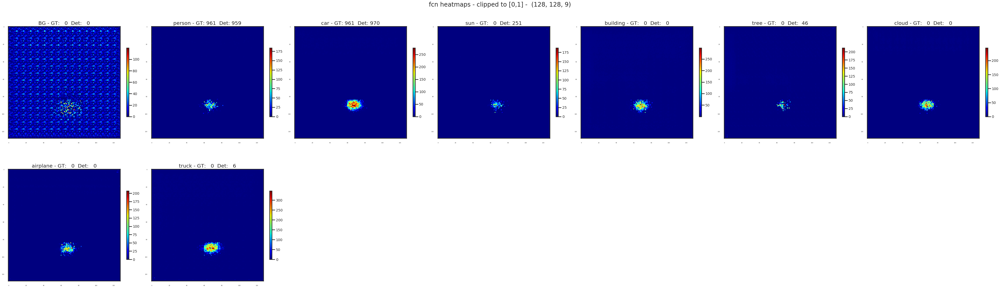

In [345]:
vis2.display_fcn_input_1(fcn_agg_hm_clipped, gt_cls_counts, dt_cls_counts, class_names, cmap = 'jet', columns = 7, title = 'fcn heatmaps - clipped to [0,1] - ')

### fcn clipped - normalized

In [347]:
# vis2.display_fcn_input_1(vis2.deprocess_image(fcn_agg_hm_clipped), gt_cls_counts, dt_cls_counts, class_names, cmap = 'jet', columns = 7, title = 'fcn heatmaps - clipped to [0 ,1] and Normalized - ')